In [1]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns
import random

random.seed(10)


def get_windows(job,n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.
    
    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

#     fit = NearestNeighbors(n_neighbors=n_neighbors+1).fit(tissue[[X,Y]].values)
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)
#     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)

In [2]:
ks = [5,10,20] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = 'csv.csv' #CA the name does not matter here other than .csv extention, we will read and combine data in the cell below
X = 'X:X'
Y = 'Y:Y'
reg = 'File Name'
file_type = 'csv'

cluster_col = 'ClusterName'
keep_cols = [X,Y,reg,cluster_col]
save_path = ''

In [3]:
#read in data and do some quick data rearrangement
n_neighbors = max(ks)
assert (file_type=='csv' or file_type =='pickle') #


if file_type == 'pickle':
    cells = pd.read_pickle(path_to_data)
if file_type == 'csv':
    #CA read data to be combined
    cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
    cells1_75 = cells1.sample(frac=0.75)
    cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
    cells2_75 = cells2.sample(frac=0.75)
    cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
    cells3_75 = cells3.sample(frac=0.75)
    
    #CA combine all data read with the next to line
cells_3groups = [cells1_75, cells2_75, cells3_75]
cells_all = pd.concat(cells_3groups)

cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values
list(cells['patients'].unique())

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/1593182092.py:21: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


[11, 10, 13, 12, 9, 4, 6, 5, 7, 8, 2, 1, 3]

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:23: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)


Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.33505892753601074 0.33570194244384766
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05094599723815918 0.3944511413574219
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10822486877441406 0.5060219764709473
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.3248610496520996 0.8328559398651123
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1994781494140625 1.0396840572357178
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20633292198181152 1.251187801361084
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21964287757873535 1.4753201007843018
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4240739345550537 1.9035429954528809
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01444387435913086 1.9268858432769775
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.043189048767089844 1.9722797870635986
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2937593460083008 2.266724109649658
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3871581554412842 0.387829065322876
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.06289315223693848 0.4614851474761963
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.11908388137817383 0.5858209133148193
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.30055809020996094 0.8883132934570312
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1997380256652832 1.0934560298919678
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20583605766296387 1.3044769763946533
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21746397018432617 1.5256638526916504
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4095151424407959 1.9393460750579834
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014386892318725586 1.962310791015625
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04216170310974121 2.0066239833831787
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26697778701782227 2.274229049682617
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3229389190673828 0.3235909938812256
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.049118995666503906 0.3805849552154541
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10442900657653809 0.48842287063598633
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2920498847961426 0.7827589511871338
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19437217712402344 0.9828569889068604
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.21336603164672852 1.2012848854064941
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2152419090270996 1.4202277660369873
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40456295013427734 1.8290460109710693
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014313936233520508 1.852231740951538
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04306793212890625 1.8977890014648438
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2818570137023926 2.180302143096924
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3361990451812744 0.33684706687927246
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.05107402801513672 0.39579105377197266
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.09941506385803223 0.49829697608947754
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28965282440185547 0.7895998954772949
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19358491897583008 0.9899327754974365
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20168399810791016 1.1964311599731445
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21295690536499023 1.413482904434204
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.3971719741821289 1.8146817684173584
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013862848281860352 1.8370308876037598
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04099392890930176 1.8801746368408203
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.260159969329834 2.1408889293670654
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3457930088043213 0.34661412239074707
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.047785043716430664 0.40207481384277344
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1009359359741211 0.5066549777984619
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.3173518180847168 0.825786828994751
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.22284793853759766 1.0559329986572266
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.21165919303894043 1.2737648487091064
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2164442539215088 1.494326114654541
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4271121025085449 1.9257190227508545
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015341997146606445 1.9500019550323486
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04841327667236328 2.0007810592651367
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.28476977348327637 2.2863197326660156
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3375129699707031 0.33817195892333984
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.05418205261230469 0.40068697929382324
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10651803016662598 0.5111789703369141
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.29888105392456055 0.8117220401763916
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19450807571411133 1.013355016708374
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20011377334594727 1.218714714050293
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.22213292121887207 1.4445359706878662
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40981507301330566 1.8583900928497314
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.0140838623046875 1.8808770179748535
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04149675369262695 1.9246079921722412
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26020002365112305 2.185378074645996
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.35190296173095703 0.3526039123535156
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05926799774169922 0.4200010299682617
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.12282800674438477 0.546807050704956
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.34461402893066406 0.8934941291809082
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.23346710205078125 1.1324808597564697
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.24193620681762695 1.3796961307525635
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2584259510040283 1.6420929431915283
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.46935510635375977 2.1163768768310547
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01770782470703125 2.144551992416382
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.053247928619384766 2.2003908157348633
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.3294038772583008 2.5305368900299072
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3202080726623535 0.32086706161499023
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.051525115966796875 0.38057899475097656
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.11481809616088867 0.498729944229126
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2926290035247803 0.7933988571166992
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19548797607421875 0.9950249195098877
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.19929981231689453 1.1995210647583008
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21963715553283691 1.4257171154022217
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.397291898727417 1.8272008895874023
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01357412338256836 1.8494160175323486
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04162907600402832 1.8931300640106201
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.26816511154174805 2.161897897720337
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32295703887939453 0.3236517906188965
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04717898368835449 0.37868404388427734
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1008000373840332 0.4825279712677002
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2840850353240967 0.7682361602783203
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.20690393447875977 0.9802639484405518
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.19843363761901855 1.1835956573486328
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21285128593444824 1.4000601768493652
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3979160785675049 1.8020830154418945
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015120983123779297 1.8255410194396973
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0468599796295166 1.8746542930603027
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2872920036315918 2.1625092029571533
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3484811782836914 0.34920215606689453
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0547640323638916 0.41147804260253906
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10608720779418945 0.520881175994873
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28174901008605957 0.804502010345459
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19856619834899902 1.0103530883789062
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20913982391357422 1.224458932876587
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21155309677124023 1.4395921230316162
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4041481018066406 1.84781813621521
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013638019561767578 1.8699519634246826
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.044053077697753906 1.9161181449890137
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.29129600524902344 2.2080230712890625
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3625521659851074 0.3632822036743164
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05428910255432129 0.42615199089050293
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.11226868629455566 0.54166579246521
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.31780219078063965 0.8614730834960938
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.20673394203186035 1.0733587741851807
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2001190185546875 1.2785742282867432
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21191906929016113 1.494093894958496
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3962421417236328 1.894484043121338
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014695882797241211 1.918222188949585
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04148292541503906 1.9619121551513672
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2659766674041748 2.228473663330078
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32346391677856445 0.3241238594055176
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05314207077026367 0.38519978523254395
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10084915161132812 0.48926329612731934
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.29151082038879395 0.7824399471282959
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19396591186523438 0.9814550876617432
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.202070951461792 1.1883549690246582
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2163679599761963 1.4087729454040527
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40029478073120117 1.8131818771362305
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014407873153686523 1.8355541229248047
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.045799970626831055 1.8835539817810059
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.28884387016296387 2.1729929447174072
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3448660373687744 0.3455471992492676
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.051020145416259766 0.40489816665649414
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.11108517646789551 0.5192561149597168
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3080620765686035 0.8291020393371582
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.20743489265441895 1.0419840812683105
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2142319679260254 1.2617180347442627
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2263810634613037 1.4924650192260742
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.4386110305786133 1.9355249404907227
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015455007553100586 1.9604930877685547
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.04434323310852051 2.0075268745422363
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.285275936126709 2.293484926223755
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.331179141998291 0.3318452835083008
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04711103439331055 0.3865208625793457
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10213875770568848 0.49164700508117676
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.288449764251709 0.7817318439483643
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1940319538116455 0.982619047164917
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2050638198852539 1.1927497386932373
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.22394585609436035 1.4210009574890137
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.41402387619018555 1.8392670154571533
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014590024948120117 1.862226963043213
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041417837142944336 1.905824899673462
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26882100105285645 2.1751961708068848
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.32848095893859863 0.3291330337524414
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04781007766723633 0.3852829933166504
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10079002380371094 0.489124059677124
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2871689796447754 0.7779908180236816
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19238615036010742 0.9775409698486328
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20599603652954102 1.188567876815796
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2153160572052002 1.4079439640045166
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40670323371887207 1.8193271160125732
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01412510871887207 1.8415627479553223
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04223799705505371 1.8859398365020752
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26056909561157227 2.147109031677246
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32520389556884766 0.32587575912475586
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04793095588684082 0.38155198097229004
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10128116607666016 0.4859771728515625
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2955210208892822 0.7834570407867432
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.20027589797973633 0.9907088279724121
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20263195037841797 1.198880672454834
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21471309661865234 1.4174659252166748
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3982658386230469 1.8198840618133545
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.014101028442382812 1.842087984085083
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04272103309631348 1.8870649337768555
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.27413177490234375 2.161773920059204
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.333233118057251 0.3339090347290039
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.04709672927856445 0.3889608383178711
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10155487060546875 0.49362993240356445
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2878689765930176 0.783397912979126
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19321513175964355 0.9821479320526123
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20671391487121582 1.1936800479888916
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21540117263793945 1.4128422737121582
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4075038433074951 1.824589729309082
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013870000839233398 1.8468232154846191
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.0447690486907959 1.8938000202178955
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2738609313964844 2.1683237552642822
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32193994522094727 0.3226020336151123
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.04731297492980957 0.3779721260070801
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.10087299346923828 0.48207616806030273
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2889108657836914 0.7727680206298828
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19478106498718262 0.9728372097015381
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20106816291809082 1.178875207901001
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2237250804901123 1.4065022468566895
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.4019351005554199 1.812716007232666
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014225959777832031 1.8354041576385498
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04140806198120117 1.8789300918579102
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.25910472869873047 2.138683795928955
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3248729705810547 0.3255472183227539
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04757213592529297 0.3810150623321533
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.10087299346923828 0.48522186279296875
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28504323959350586 0.7721002101898193
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19276213645935059 0.9699649810791016
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20292186737060547 1.1776807308197021
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21409010887145996 1.3954918384552002
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40146422386169434 1.8013360500335693
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014166116714477539 1.824186086654663
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04522585868835449 1.8715620040893555
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.27233314514160156 2.1446352005004883
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.32070183753967285 0.32135486602783203
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04806017875671387 0.3773181438446045
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10030508041381836 0.48131704330444336
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2904551029205322 0.773576021194458
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1923820972442627 0.973517894744873
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20397090911865234 1.1823740005493164
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.22240900993347168 1.4090330600738525
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.420809268951416 1.8343181610107422
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015187978744506836 1.857762098312378
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.046527862548828125 1.906562089920044
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2774481773376465 2.1847312450408936
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3272228240966797 0.3279149532318115
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04981184005737305 0.3856220245361328
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10261726379394531 0.49137115478515625
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2940859794616699 0.7872309684753418
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19229483604431152 0.9865391254425049
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2057340145111084 1.1970560550689697
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21262407302856445 1.413212776184082
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4228243827819824 1.840435266494751
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014171123504638672 1.8630342483520508
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04123377799987793 1.9063749313354492
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2694237232208252 2.1763978004455566
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3292241096496582 0.3299219608306885
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04959416389465332 0.38721203804016113
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1067960262298584 0.4971439838409424
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28644585609436035 0.7853059768676758
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19053196907043457 0.9827220439910889
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.23431181907653809 1.2217190265655518
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.22839808464050293 1.4539480209350586
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.43016505241394043 1.8884000778198242
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014912128448486328 1.9122419357299805
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04316401481628418 1.9576590061187744
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.28745198249816895 2.245710849761963
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32619714736938477 0.32685399055480957
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.047129154205322266 0.38188695907592773
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10066914558410645 0.4856748580932617
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.29146695137023926 0.7787601947784424
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2044999599456787 0.9905941486358643
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2126469612121582 1.20881986618042
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2250511646270752 1.4377331733703613
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40838098526000977 1.850412130355835
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014396905899047852 1.8729329109191895
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04258990287780762 1.9176809787750244
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.27983522415161133 2.198085069656372
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32543015480041504 0.3261120319366455
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05263376235961914 0.3863959312438965
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10665392875671387 0.4962949752807617
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2883777618408203 0.7863450050354004
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19555425643920898 0.9888231754302979
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20076990127563477 1.194565773010254
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21562910079956055 1.4141178131103516
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40683484077453613 1.824902057647705
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014099359512329102 1.8471882343292236
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04181504249572754 1.8910908699035645
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2656409740447998 2.1572959423065186
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.33159494400024414 0.3322429656982422
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04677915573120117 0.3865971565246582
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.1002500057220459 0.4898350238800049
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.29401397705078125 0.7854657173156738
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1981198787689209 0.9883818626403809
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20466899871826172 1.198883056640625
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21312403678894043 1.4157438278198242
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4058570861816406 1.825711965560913
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014002799987792969 1.8476028442382812
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.041445016860961914 1.891150951385498
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2663581371307373 2.158082962036133
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.3238539695739746 0.3245060443878174
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.046971797943115234 0.37917208671569824
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10091304779052734 0.48310112953186035
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.29182004928588867 0.7765181064605713
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19591403007507324 0.9772610664367676
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20641183853149414 1.1885628700256348
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21661376953125 1.4091429710388184
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4038970470428467 1.817249059677124
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013788223266601562 1.83927321434021
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04111981391906738 1.8824491500854492
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26148319244384766 2.1444880962371826
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3388330936431885 0.3394889831542969
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04754805564880371 0.3947620391845703
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10403299331665039 0.5019829273223877
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2919032573699951 0.7955420017242432
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19292902946472168 0.9933388233184814
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20223188400268555 1.200192928314209
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21132111549377441 1.4150021076202393
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4277520179748535 1.8469440937042236
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.014220952987670898 1.8704712390899658
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04115915298461914 1.9137780666351318
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26175713539123535 2.1761043071746826
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3262801170349121 0.32704591751098633
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.048135995864868164 0.38308095932006836
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10195112228393555 0.48812198638916016
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2873978614807129 0.7771236896514893
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1943519115447998 0.9783298969268799
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20531821250915527 1.1884541511535645
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21382761001586914 1.4065406322479248
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40539002418518066 1.815986156463623
Starting: 6/13 : 38592-6
Finishing: 6/13 : 38592-6 0.013940095901489258 1.8381450176239014
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04096221923828125 1.8813083171844482
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2633638381958008 2.1452300548553467
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32535696029663086 0.326016902923584
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.04757237434387207 0.38139915466308594
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.10032010078430176 0.4847991466522217
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.30229997634887695 0.7888288497924805
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19978809356689453 0.9933550357818604
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20438194274902344 1.2028601169586182
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2154390811920166 1.4219651222229004
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40678906440734863 1.8328540325164795
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013737201690673828 1.8547892570495605
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04112887382507324 1.898036003112793
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.2611210346221924 2.159723997116089
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.325681209564209 0.32633209228515625
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04736614227294922 0.381458044052124
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10093998908996582 0.48557305335998535
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28906893730163574 0.7763369083404541
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19302821159362793 0.9766080379486084
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2036731243133545 1.185178279876709
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21805691719055176 1.4072041511535645
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40131187438964844 1.8128790855407715
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.014307737350463867 1.8354527950286865
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.0413820743560791 1.8789482116699219
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.27286481857299805 2.1524581909179688
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3231008052825928 0.32375192642211914
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.047914981842041016 0.3790700435638428
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10143685340881348 0.48361802101135254
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28822970390319824 0.7734909057617188
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19259095191955566 0.9712560176849365
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20454001426696777 1.1804280281066895
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2144639492034912 1.3984417915344238
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.41007113456726074 1.8127660751342773
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014554023742675781 1.8359451293945312
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04362916946411133 1.881775140762329
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2667839527130127 2.149167060852051
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32459592819213867 0.3252599239349365
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05152106285095215 0.38512325286865234
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10846710205078125 0.4978182315826416
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.29762887954711914 0.7973959445953369
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19508695602416992 0.9975190162658691
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20670390129089355 1.2090749740600586
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21342682838439941 1.4267559051513672
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40105271339416504 1.8321027755737305
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.013718843460083008 1.8543798923492432
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04140210151672363 1.8979198932647705
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26587486267089844 2.1644740104675293


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32967495918273926 0.33032989501953125
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0489039421081543 0.3869459629058838
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10042595863342285 0.4905698299407959
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2928318977355957 0.785067081451416
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19297003746032715 0.9829099178314209
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20513319969177246 1.1926350593566895
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21703386306762695 1.4131629467010498
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.4013071060180664 1.8186659812927246
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014335870742797852 1.841599941253662
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.042539119720458984 1.8863251209259033
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2684457302093506 2.155364751815796
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3259429931640625 0.32660603523254395
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.049407958984375 0.3840367794036865
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.10677385330200195 0.49401211738586426
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2880897521972656 0.7839028835296631
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19547104835510254 0.9867210388183594
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2064821720123291 1.1983399391174316
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21861886978149414 1.4206929206848145
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40277099609375 1.8276450634002686
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014036893844604492 1.8500537872314453
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.042654991149902344 1.8947980403900146
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2635209560394287 2.158950090408325
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.327786922454834 0.3284480571746826
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04782986640930176 0.38404297828674316
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10174822807312012 0.48907899856567383
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2870967388153076 0.7779648303985596
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19266295433044434 0.9780380725860596
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2065441608428955 1.1893811225891113
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21490216255187988 1.408125877380371
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4110100269317627 1.8234851360321045
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.014612913131713867 1.8465819358825684
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04436039924621582 1.8931493759155273
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2649819850921631 2.158787965774536
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32921910285949707 0.3298768997192383
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05236697196960449 0.3901100158691406
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.11224007606506348 0.5057058334350586
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2928318977355957 0.8003318309783936
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.20391297340393066 1.011749029159546
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2024707794189453 1.2190988063812256
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21431899070739746 1.4377479553222656
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.402634859085083 1.8451037406921387
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01412200927734375 1.8676087856292725
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.04125499725341797 1.9109742641448975
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26278114318847656 2.1744089126586914
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3335578441619873 0.3342766761779785
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.04797697067260742 0.38965511322021484
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10199689865112305 0.49489569664001465
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2938268184661865 0.7904808521270752
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1933438777923584 0.9888019561767578
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20683622360229492 1.2003121376037598
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21175336837768555 1.4160072803497314
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.4154529571533203 1.8359827995300293
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014806032180786133 1.8591539859771729
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04551410675048828 1.9068758487701416
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26453089714050293 2.172006845474243
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32288193702697754 0.32353901863098145
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.05104207992553711 0.38208818435668945
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10927987098693848 0.4945979118347168
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28867197036743164 0.7850282192230225
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1913769245147705 0.981395959854126
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20210003852844238 1.1881468296051025
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2160511016845703 1.4077861309051514
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4003760814666748 1.8123672008514404
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014101982116699219 1.834885835647583
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04113602638244629 1.8781020641326904
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26462292671203613 2.143310070037842
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.32970285415649414 0.3303687572479248
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04863619804382324 0.3868260383605957
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.10162472724914551 0.49167895317077637
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2876300811767578 0.7811849117279053
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19374585151672363 0.9821009635925293
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.205078125 1.1921319961547852
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21902990341186523 1.4153380393981934
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4239461421966553 1.8436739444732666
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013880014419555664 1.8658597469329834
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04100489616394043 1.909024953842163
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26465463638305664 2.174358606338501
Starting: 6/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3250761032104492 0.3257308006286621
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.047878265380859375 0.38129305839538574
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.09981513023376465 0.4841928482055664
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2859070301055908 0.7717678546905518
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1927788257598877 0.969567060470581
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2009449005126953 1.175266981124878
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.214033842086792 1.3929011821746826
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40228891372680664 1.7993931770324707
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014088869094848633 1.821929931640625
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04094099998474121 1.8650221824645996
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2629818916320801 2.1285769939422607
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3263370990753174 0.3269820213317871
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05313587188720703 0.3878459930419922
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10805487632751465 0.4992508888244629
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2865159511566162 0.7874090671539307
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2046520709991455 0.9967660903930664
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20010900497436523 1.2019288539886475
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21564793586730957 1.421562910079956
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.3986630439758301 1.824770212173462
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013913869857788086 1.846951961517334
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04110383987426758 1.8901891708374023
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26042604446411133 2.1511929035186768
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.32371997833251953 0.32439208030700684
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04777693748474121 0.379957914352417
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10056185722351074 0.48361778259277344
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.30150508880615234 0.7868528366088867
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19634509086608887 0.9881372451782227
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20337986946105957 1.196544885635376
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2157580852508545 1.4160029888153076
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.39794492721557617 1.8180830478668213
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013941287994384766 1.8403971195220947
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.040780067443847656 1.8833060264587402
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26021313667297363 2.144092082977295
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3334951400756836 0.3341541290283203
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.050009727478027344 0.392488956451416
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1089169979095459 0.5045621395111084
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.29219508171081543 0.7985680103302002
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19529294967651367 1.0006318092346191
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20374703407287598 1.209287166595459
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21542596817016602 1.428785800933838
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4071028232574463 1.840134859085083
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014108896255493164 1.8628370761871338
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041501760482788086 1.9065189361572266
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26566076278686523 2.172745943069458
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3197638988494873 0.3204176425933838
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04781007766723633 0.3757970333099365
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10093402862548828 0.47983789443969727
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.28775811195373535 0.7692558765411377
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.2011420726776123 0.9750969409942627
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20828795433044434 1.188889980316162
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2150721549987793 1.4076101779937744
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4041759967803955 1.8159120082855225
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01395106315612793 1.8377909660339355
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.041361093521118164 1.8812451362609863
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26502490043640137 2.14684796333313
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3218069076538086 0.3224639892578125
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.047122955322265625 0.37728285789489746
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.1004478931427002 0.4807868003845215
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28744983673095703 0.7698781490325928
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19354796409606934 0.9703490734100342
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20537495613098145 1.1805620193481445
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.22283291816711426 1.407580852508545
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40259814262390137 1.81435227394104
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013948917388916016 1.8363430500030518
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.04146909713745117 1.8799018859863281
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26174497604370117 2.1422202587127686
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32856106758117676 0.3292210102081299
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.051239013671875 0.38809823989868164
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10375785827636719 0.49509191513061523
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28565287590026855 0.7825930118560791
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19190502166748047 0.9816827774047852
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20461487770080566 1.191213607788086
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2204911708831787 1.4159131050109863
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40009093284606934 1.8203470706939697
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013943910598754883 1.8427367210388184
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04173111915588379 1.88657808303833
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2653329372406006 2.1525440216064453
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3396170139312744 0.3402698040008545
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.048120975494384766 0.39609813690185547
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10142803192138672 0.5009689331054688
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2864828109741211 0.7893848419189453
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19149208068847656 0.9859919548034668
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20401692390441895 1.1947882175445557
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21204495429992676 1.410546064376831
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40366697311401367 1.8189120292663574
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014241695404052734 1.8416121006011963
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04156780242919922 1.8853237628936768
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26358985900878906 2.149596929550171
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3280301094055176 0.32867908477783203
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.046540021896362305 0.3827519416809082
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10105395317077637 0.4868948459625244
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28339290618896484 0.7720658779144287
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19282197952270508 0.9719188213348389
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20421195030212402 1.1809241771697998
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21551108360290527 1.40049409866333
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3983030319213867 1.8029513359069824
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014024972915649414 1.8255188465118408
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04125714302062988 1.868865966796875
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26668381690979004 2.136218786239624
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3247718811035156 0.3254261016845703
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.04768514633178711 0.3808560371398926
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10247111320495605 0.4863760471343994
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2871890068054199 0.7752358913421631
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1926581859588623 0.975167989730835
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20531582832336426 1.1854438781738281
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21362876892089844 1.4030866622924805
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.3956000804901123 1.8028149604797363
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014240026473999023 1.8250091075897217
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04203605651855469 1.8691449165344238
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2609422206878662 2.130667209625244
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3242359161376953 0.3249669075012207
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04800987243652344 0.3806021213531494
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10164999961853027 0.48546695709228516
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2902090549468994 0.7775559425354004
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19287490844726562 0.9774978160858154
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20547795295715332 1.1877729892730713
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21667098999023438 1.4086227416992188
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40404295921325684 1.817201852798462
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013681173324584961 1.8396151065826416
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041535139083862305 1.8833889961242676
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.266524076461792 2.150562047958374
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3246777057647705 0.3253350257873535
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04734492301940918 0.38031005859375
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10201597213745117 0.48562192916870117
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.3035430908203125 0.7909119129180908
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1995227336883545 0.9978418350219727
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.21352791786193848 1.2165617942810059
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21725106239318848 1.4376769065856934
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40450310707092285 1.8463850021362305
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013870000839233398 1.8684780597686768
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.042413949966430664 1.9130218029022217
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2640559673309326 2.1777658462524414
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32884693145751953 0.32953619956970215
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.05010795593261719 0.3874320983886719
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10038137435913086 0.49091410636901855
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2858550548553467 0.7784192562103271
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19517111778259277 0.9783370494842529
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20482611656188965 1.188107967376709
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21365976333618164 1.4058470726013184
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4053640365600586 1.8153910636901855
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013616800308227539 1.837350845336914
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04111003875732422 1.880537748336792
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.2613239288330078 2.1424219608306885
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3237440586090088 0.32439398765563965
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.051954030990600586 0.38396692276000977
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.11029696464538574 0.49742794036865234
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2883787155151367 0.7875537872314453
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19249510765075684 0.9849181175231934
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20857000350952148 1.198152780532837
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21227765083312988 1.413975715637207
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4031500816345215 1.8214631080627441
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013772726058959961 1.8435349464416504
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04065394401550293 1.886491060256958
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2644510269165039 2.15152907371521
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3455939292907715 0.34625816345214844
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04809880256652832 0.4023270606994629
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10049605369567871 0.5059361457824707
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.29232096672058105 0.7999217510223389
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19298672676086426 0.9997949600219727
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20220017433166504 1.2071480751037598
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21857213973999023 1.4292328357696533
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.42458200454711914 1.8578929901123047
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014123678207397461 1.8800969123840332
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.044873952865600586 1.927187204360962
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.28232312202453613 2.2100961208343506
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32410693168640137 0.32476305961608887
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.046852827072143555 0.37912917137145996
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1050260066986084 0.4872469902038574
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.285916805267334 0.7748479843139648
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1929616928100586 0.9725630283355713
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20140695571899414 1.1785600185394287
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21292710304260254 1.394953966140747
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40455102920532227 1.803602933883667
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014169931411743164 1.8260769844055176
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04201912879943848 1.8703250885009766
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26820993423461914 2.1391050815582275
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3280761241912842 0.32872724533081055
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.0483548641204834 0.384990930557251
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10181403160095215 0.48996806144714355
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2951631546020508 0.7870829105377197
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19323968887329102 0.9852516651153564
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20769405364990234 1.1976377964019775
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21454405784606934 1.4157838821411133
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4397099018096924 1.8604826927185059
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014626026153564453 1.8837168216705322
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04120230674743652 1.9271481037139893
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2764880657196045 2.204241991043091
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3302910327911377 0.3309500217437744
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05082988739013672 0.390125036239624
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10264086723327637 0.4962000846862793
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2882969379425049 0.7863020896911621
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1917879581451416 0.9852421283721924
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20592784881591797 1.1958959102630615
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21267080307006836 1.4121971130371094
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4032876491546631 1.8196887969970703
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.014150142669677734 1.8424701690673828
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04551506042480469 1.8903112411499023
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2780020236968994 2.1689772605895996
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3265657424926758 0.3272268772125244
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.051880836486816406 0.38838791847229004
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10026216506958008 0.4918959140777588
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.286940336227417 0.7804789543151855
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19286012649536133 0.9781761169433594
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2048478126525879 1.187798023223877
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21587872505187988 1.407193899154663
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.41548681259155273 1.8269410133361816
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.015329837799072266 1.8510849475860596
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04623913764953613 1.899968147277832
Starting: 10/13 : 54774-4
Finishing: 10/13 : 54774-4 0.2633631229400635 2.163945198059082
Starting

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.32687997817993164 0.3275468349456787
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.048310041427612305 0.38355588912963867
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.1031639575958252 0.4904351234436035
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2861039638519287 0.778285026550293
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.194810152053833 0.9781041145324707
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2051222324371338 1.188056230545044
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21670293807983398 1.4089248180389404
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40490221977233887 1.8180930614471436
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.015491724014282227 1.8430390357971191
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04181241989135742 1.8870081901550293
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2658228874206543 2.1535139083862305
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3405611515045166 0.34124016761779785
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04746818542480469 0.39631199836730957
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10040783882141113 0.49991798400878906
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2861602306365967 0.7877740859985352
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1944129467010498 0.9869771003723145
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20819997787475586 1.1997859477996826
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21239614486694336 1.4157869815826416
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.4058420658111572 1.8257851600646973
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013891935348510742 1.847869873046875
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.041342973709106445 1.8914387226104736
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2636890411376953 2.1556949615478516
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.32466721534729004 0.32532525062561035
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.047309160232543945 0.38059210777282715
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10107088088989258 0.48475074768066406
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2888669967651367 0.7753260135650635
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19150376319885254 0.9716858863830566
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20325803756713867 1.1795802116394043
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21339797973632812 1.3965492248535156
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.41015005111694336 1.8113222122192383
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013786077499389648 1.8331258296966553
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.040704965591430664 1.8759429454803467
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26068592071533203 2.13717699050903

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.36454010009765625 0.36529994010925293
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.051448822021484375 0.4244518280029297
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10830807685852051 0.5362389087677002
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.31748485565185547 0.8556849956512451
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.20255208015441895 1.063509225845337
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20621585845947266 1.274911880493164
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2272200584411621 1.506005048751831
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4353830814361572 1.9458470344543457
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014841794967651367 1.9694468975067139
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04496002197265625 2.016916036605835
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2792201042175293 2.2968530654907227
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.33034586906433105 0.33103489875793457
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04662013053894043 0.3853459358215332
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.1004030704498291 0.48879504203796387
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2892730236053467 0.7796530723571777
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19569778442382812 0.9827048778533936
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20621085166931152 1.194000005722046
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.22071409225463867 1.418816089630127
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.41332411766052246 1.836860179901123
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01468515396118164 1.8594772815704346
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04475903511047363 1.9064390659332275
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2665889263153076 2.173600912094116
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.32816123962402344 0.32881832122802734
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.0484161376953125 0.3848750591278076
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10150504112243652 0.48948025703430176
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2862589359283447 0.7773680686950684
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19213294982910156 0.9762439727783203
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20463085174560547 1.1854870319366455
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21677613258361816 1.405890941619873
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.40057921409606934 1.810777187347412
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.01416015625 1.8328759670257568
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.042101144790649414 1.8770761489868164
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2644479274749756 2.142098903656006
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.34755706787109375 0.3482680320739746
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.04987788200378418 0.40638184547424316
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10776805877685547 0.5172951221466064
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.29935216903686523 0.8187248706817627
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19307398796081543 1.0163321495056152
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2189629077911377 1.2406070232391357
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.226959228515625 1.471195936203003
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4057278633117676 1.8809328079223633
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014413118362426758 1.9036049842834473
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04122209548950195 1.946983814239502
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.26763010025024414 2.2152669429779053
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.34647202491760254 0.34717392921447754
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05047011375427246 0.40611815452575684
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10513114929199219 0.5151917934417725
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.31586694717407227 0.8333711624145508
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.2114090919494629 1.0528559684753418
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20462894439697266 1.262603998184204
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2169017791748047 1.4833006858825684
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.41518497467041016 1.903228759765625
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014211177825927734 1.9259161949157715
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04198193550109863 1.9700071811676025
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26148414611816406 2.232177972793579
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.32906293869018555 0.32975196838378906
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05252504348754883 0.3899869918823242
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10037112236022949 0.49358415603637695
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2903330326080322 0.785567045211792
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19150924682617188 0.9819130897521973
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20608782768249512 1.192620038986206
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21985101699829102 1.4167602062225342
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.41608214378356934 1.837378978729248
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013676166534423828 1.8591229915618896
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04196500778198242 1.9031519889831543
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2632181644439697 2.1669492721557617
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.324753999710083 0.3255610466003418
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04780697822570801 0.38090014457702637
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10049319267272949 0.4848809242248535
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28664493560791016 0.7731800079345703
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1951131820678711 0.9731841087341309
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20264005661010742 1.1807429790496826
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2185049057006836 1.4028949737548828
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.3995089530944824 1.8066587448120117
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013889074325561523 1.829082727432251
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04174518585205078 1.873042345046997
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26198911666870117 2.1357083320617676
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3352348804473877 0.33588099479675293
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04823017120361328 0.39193105697631836
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10003495216369629 0.4950079917907715
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.29256296157836914 0.789215087890625
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19892215728759766 0.9950582981109619
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.203721284866333 1.2035393714904785
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21446704864501953 1.4217360019683838
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4020261764526367 1.8278942108154297
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014178037643432617 1.8504951000213623
Starting: 1/13 : 48411-6
Finishing: 1/13 : 48411-6 0.04291105270385742 1.8955819606781006
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26346707344055176 2.159611940383911
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3203279972076416 0.3209822177886963
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.05047106742858887 0.3791522979736328
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10720610618591309 0.4896700382232666
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28996992111206055 0.7813072204589844
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19222402572631836 0.9783902168273926
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2034156322479248 1.1866428852081299
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21259403228759766 1.4027650356292725
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4021329879760742 1.8090879917144775
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015465974807739258 1.832834005355835
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04112505912780762 1.8761100769042969
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26512980461120605 2.1418018341064453
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.33272314071655273 0.3333868980407715
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0497889518737793 0.391185998916626
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10796284675598145 0.502338171005249
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2912256717681885 0.7953808307647705
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1944599151611328 0.9947168827056885
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.2042698860168457 1.2037618160247803
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21274971961975098 1.4200599193572998
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4151289463043213 1.8395459651947021
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01563286781311035 1.863152027130127
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04398608207702637 1.9093749523162842
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2708749771118164 2.1808838844299316
Starting: 9

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3377799987792969 0.3384280204772949
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.048509836196899414 0.394528865814209
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10012698173522949 0.49772071838378906
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28720569610595703 0.7865588665008545
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1967470645904541 0.9903099536895752
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.19986367225646973 1.1953117847442627
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2143700122833252 1.4138319492340088
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.40504980087280273 1.8230559825897217
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013667106628417969 1.844642162322998
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04165506362915039 1.8883650302886963
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26412010192871094 2.1531851291656494
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3233370780944824 0.3239939212799072
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.0469660758972168 0.37865304946899414
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.09996700286865234 0.48174166679382324
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28388190269470215 0.7672808170318604
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1939699649810791 0.9659149646759033
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20289897918701172 1.173509120941162
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21512103080749512 1.3922040462493896
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4046180248260498 1.8007421493530273
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013786077499389648 1.822396993637085
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04201102256774902 1.866481065750122
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2627100944519043 2.1297390460968018
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3401658535003662 0.34084582328796387
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05087995529174805 0.3994729518890381
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10682010650634766 0.5095832347869873
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2917037010192871 0.803070068359375
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19425392150878906 1.0026028156280518
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20359182357788086 1.2111828327178955
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21744990348815918 1.4326188564300537
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40990376472473145 1.8467729091644287
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014206886291503906 1.8696517944335938
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.043988943099975586 1.9157710075378418
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2627420425415039 2.179295063018799
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3268239498138428 0.3274991512298584
Starting: 7/13 : 18538-6
Finishing: 7/13 : 18538-6 0.04744386672973633 0.3829162120819092
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10401201248168945 0.49007511138916016
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28572702407836914 0.7775290012359619
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1933279037475586 0.9757046699523926
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20118093490600586 1.1815500259399414
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21179485321044922 1.396939992904663
Starting: 5/13 : 33548-6
Finishing: 5/13 : 33548-6 0.39722204208374023 1.7987251281738281
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014085769653320312 1.821401834487915
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.041693925857543945 1.8652338981628418
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.26384878158569336 2.1297547817230225
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3275289535522461 0.32819104194641113
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04707002639770508 0.38321685791015625
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10088014602661133 0.48770809173583984
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.29805636405944824 0.7876794338226318
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19480609893798828 0.9898202419281006
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20164799690246582 1.1963422298431396
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.22121810913085938 1.421684980392456
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4078989028930664 1.833906888961792
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014003276824951172 1.856250286102295
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041812896728515625 1.9001529216766357
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2636857032775879 2.164527654647827
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.3215937614440918 0.32230091094970703
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04882502555847168 0.3789381980895996
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10107612609863281 0.4831559658050537
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2901289463043213 0.7750170230865479
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1932671070098877 0.9730281829833984
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.20615816116333008 1.1838409900665283
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.22083830833435059 1.4082612991333008
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40670061111450195 1.8193137645721436
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013934850692749023 1.8414678573608398
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.041769981384277344 1.8854577541351318
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26075196266174316 2.146791934967041
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3253960609436035 0.3260612487792969
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.05019807815551758 0.3845522403717041
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10097885131835938 0.4890408515930176
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28974294662475586 0.7805569171905518
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19224286079406738 0.9778618812561035
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20487594604492188 1.1874511241912842
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.22075581550598145 1.4117469787597656
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.41289687156677246 1.8290050029754639
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013863086700439453 1.8511230945587158
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04231119155883789 1.8955051898956299
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26189088821411133 2.1580629348754883
St

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3328287601470947 0.33349084854125977
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04827380180358887 0.38944578170776367
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10136890411376953 0.49413514137268066
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28723883628845215 0.7832226753234863
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19270610809326172 0.9809970855712891
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2058570384979248 1.191498041152954
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21872282028198242 1.4137909412384033
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4120171070098877 1.8300893306732178
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013908863067626953 1.8525390625
Starting: 3/13 : 48411-6
Finishing: 3/13 : 48411-6 0.04458189010620117 1.8992810249328613
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.262725830078125 2.162674903869629
Starting: 8

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.33001208305358887 0.330747127532959
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04664921760559082 0.38452816009521484
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10088706016540527 0.4883711338043213
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2869551181793213 0.7768840789794922
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1974167823791504 0.9788727760314941
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20262598991394043 1.1862351894378662
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21643781661987305 1.4063940048217773
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4016568660736084 1.8126578330993652
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014539003372192383 1.835188865661621
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04441976547241211 1.8817839622497559
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2614140510559082 2.143738031387329
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3286290168762207 0.32927703857421875
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04796195030212402 0.3848400115966797
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1010291576385498 0.4889819622039795
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2855691909790039 0.7762041091918945
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19214105606079102 0.9753520488739014
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2038567066192627 1.183892011642456
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21950697898864746 1.4069440364837646
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.4028012752532959 1.8138601779937744
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.01407313346862793 1.8358941078186035
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04140591621398926 1.8794281482696533
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2611508369445801 2.141134023666382
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32231879234313965 0.32296180725097656
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04928874969482422 0.37980103492736816
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10138297080993652 0.4842240810394287
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28786706924438477 0.773730993270874
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19447708129882812 0.972954273223877
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2046661376953125 1.1823501586914062
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21235108375549316 1.3981900215148926
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4085240364074707 1.8107659816741943
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014052867889404297 1.832791805267334
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04177594184875488 1.8766717910766602
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2616689205169678 2.1389307975769043
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.32639503479003906 0.327164888381958
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.047328948974609375 0.38229990005493164
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10181403160095215 0.487307071685791
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.28690004348754883 0.7760720252990723
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.1966390609741211 0.9800360202789307
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20019912719726562 1.185209035873413
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.2155170440673828 1.4048430919647217
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.402097225189209 1.8111350536346436
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.014241933822631836 1.8343920707702637
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041899919509887695 1.8784492015838623
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26284003257751465 2.1419339179992676
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3215599060058594 0.3222057819366455
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.048177242279052734 0.3778202533721924
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10185599327087402 0.4826958179473877
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2880549430847168 0.7723948955535889
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19207119941711426 0.9712350368499756
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20166492462158203 1.1775720119476318
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21128392219543457 1.392307996749878
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.39884495735168457 1.7952990531921387
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013743877410888672 1.8170990943908691
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04140019416809082 1.8605701923370361
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.26497673988342285 2.1261167526245117
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3231849670410156 0.32383179664611816
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.048104047775268555 0.37968015670776367
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10049986839294434 0.4832336902618408
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2926151752471924 0.777482271194458
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19367289543151855 0.9758639335632324
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20781779289245605 1.188405990600586
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21727585792541504 1.4091951847076416
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4050447940826416 1.8182337284088135
Starting: 7/13 : 38592-6
Finishing: 7/13 : 38592-6 0.014274120330810547 1.840757131576538
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04224276542663574 1.8852009773254395
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.26349401473999023 2.1492631435394287
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3277907371520996 0.32843971252441406
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04986286163330078 0.3861067295074463
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10038495063781738 0.4897758960723877
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28656530380249023 0.7779619693756104
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19585299491882324 0.9808559417724609
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20424866676330566 1.1900858879089355
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21614718437194824 1.4098999500274658
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.39878225326538086 1.812812089920044
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013823986053466797 1.8350861072540283
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04149770736694336 1.8786938190460205
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.264650821685791 2.143988847732544
Start

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.33439087867736816 0.33504199981689453
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05210590362548828 0.39522886276245117
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10785102844238281 0.5069210529327393
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.29113221168518066 0.7999391555786133
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.20144295692443848 1.0064280033111572
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20158100128173828 1.2130508422851562
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21888399124145508 1.4359087944030762
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4030730724334717 1.8433349132537842
Starting: 8/13 : 38592-6
Finishing: 8/13 : 38592-6 0.01392817497253418 1.8656549453735352
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04221010208129883 1.9100890159606934
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26305103302001953 2.1738429069519043
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.3372013568878174 0.3378472328186035
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05134010314941406 0.3975679874420166
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.10419487953186035 0.5057477951049805
Starting: 4/13 : 24952-6
Finishing: 4/13 : 24952-6 0.2845120429992676 0.7919900417327881
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19318485260009766 0.9924049377441406
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20499515533447266 1.2022688388824463
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21578192710876465 1.4222700595855713
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40474796295166016 1.8312499523162842
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.015067100524902344 1.8548381328582764
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04346013069152832 1.9004862308502197
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.26882481575012207 2.170048952102661
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3316960334777832 0.3323519229888916
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.04757285118103027 0.3877067565917969
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10035371780395508 0.49127864837646484
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.28936195373535156 0.7825028896331787
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19497895240783691 0.9846088886260986
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20248723030090332 1.192018985748291
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.2204899787902832 1.4163298606872559
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40244507789611816 1.8229670524597168
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013882875442504883 1.8453090190887451
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041175127029418945 1.8885769844055176
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26535701751708984 2.154597759246826
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32965683937072754 0.3303108215332031
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.047696828842163086 0.38582301139831543
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10109901428222656 0.4900999069213867
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2878849506378174 0.7798359394073486
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19546008110046387 0.9823658466339111
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20282602310180664 1.1899940967559814
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21874403953552246 1.4126379489898682
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4129600524902344 1.8304259777069092
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.017149925231933594 1.8577187061309814
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.043930768966674805 1.9043917655944824
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.26373291015625 2.1687207221984863
Sta

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.3251981735229492 0.3258633613586426
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04788088798522949 0.381450891494751
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10315299034118652 0.48797607421875
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2884101867675781 0.7781462669372559
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19460463523864746 0.9799487590789795
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20086908340454102 1.1858088970184326
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21512293815612793 1.405156135559082
Starting: 4/13 : 33548-6
Finishing: 4/13 : 33548-6 0.41233372688293457 1.8217060565948486
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014796972274780273 1.844877004623413
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04313397407531738 1.890151023864746
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2629408836364746 2.153777837753296
Starting: 10/

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.31943297386169434 0.3200850486755371
Starting: 8/13 : 18538-6
Finishing: 8/13 : 18538-6 0.04820704460144043 0.3756749629974365
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10122895240783691 0.4800300598144531
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.28655409812927246 0.7683069705963135
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.2986929416656494 1.0718059539794922
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.2062211036682129 1.288815975189209
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21461987495422363 1.5071940422058105
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40548205375671387 1.9169809818267822
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013810873031616211 1.9396238327026367
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04202890396118164 1.9838509559631348
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.261699914932251 2.2462379932403564
Starti

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.3293478488922119 0.3299999237060547
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04861164093017578 0.38612890243530273
Starting: 2/13 : 19142-6
Finishing: 2/13 : 19142-6 0.10641002655029297 0.4955708980560303
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2829399108886719 0.7801659107208252
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19380807876586914 0.98095703125
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20355892181396484 1.1893768310546875
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.2165210247039795 1.4096388816833496
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.39821290969848633 1.81201171875
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.014462947845458984 1.834846019744873
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.042159080505371094 1.8792829513549805
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2696192264556885 2.1494741439819336
Starting: 8/13

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 2/13 : 17633-6
Finishing: 2/13 : 17633-6 0.32984018325805664 0.33048486709594727
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.04854464530944824 0.38682079315185547
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10194683074951172 0.49279284477233887
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.2944650650024414 0.7890088558197021
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19358515739440918 0.9901878833770752
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20000886917114258 1.195051908493042
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21997594833374023 1.4184191226959229
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.40226006507873535 1.8247489929199219
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013946056365966797 1.8469789028167725
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.041577816009521484 1.8906898498535156
Starting: 6/13 : 54774-4
Finishing: 6/13 : 54774-4 0.2639949321746826 2.1553189754486084


/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 4/13 : 17633-6
Finishing: 4/13 : 17633-6 0.33429598808288574 0.33495306968688965
Starting: 10/13 : 18538-6
Finishing: 10/13 : 18538-6 0.04809999465942383 0.3906691074371338
Starting: 1/13 : 19142-6
Finishing: 1/13 : 19142-6 0.10198402404785156 0.49608588218688965
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.287647008895874 0.785485029220581
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.19205808639526367 0.9846971035003662
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20487689971923828 1.1941161155700684
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21877193450927734 1.4164531230926514
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4022641181945801 1.8229119777679443
Starting: 6/13 : 38592-6
Finishing: 6/13 : 38592-6 0.013667821884155273 1.8448939323425293
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.04102301597595215 1.8880298137664795
Starting: 9/13 : 54774-4
Finishing: 9/13 : 54774-4 0.2633976936340332 2.1520297527313232
Star

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.33396482467651367 0.3346130847930908
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.047257184982299805 0.38938283920288086
Starting: 5/13 : 19142-6
Finishing: 5/13 : 19142-6 0.10308194160461426 0.49556708335876465
Starting: 3/13 : 24952-6
Finishing: 3/13 : 24952-6 0.29022693634033203 0.7879250049591064
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19203877449035645 0.9871201515197754
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20709705352783203 1.1988511085510254
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21257495880126953 1.4149668216705322
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4084780216217041 1.8282313346862793
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013657093048095703 1.8504269123077393
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.04123115539550781 1.8937549591064453
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2625439167022705 2.156890869140625
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.332489013671875 0.3332211971282959
Starting: 6/13 : 18538-6
Finishing: 6/13 : 18538-6 0.047482967376708984 0.3882451057434082
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10148811340332031 0.4927999973297119
Starting: 5/13 : 24952-6
Finishing: 5/13 : 24952-6 0.28763580322265625 0.7821178436279297
Starting: 13/13 : 30411-6
Finishing: 13/13 : 30411-6 0.19500398635864258 0.9818141460418701
Starting: 12/13 : 31022-6
Finishing: 12/13 : 31022-6 0.20252418518066406 1.1890602111816406
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21755313873291016 1.410163402557373
Starting: 1/13 : 33548-6
Finishing: 1/13 : 33548-6 0.4002046585083008 1.814450740814209
Starting: 9/13 : 38592-6
Finishing: 9/13 : 38592-6 0.013883829116821289 1.8364028930664062
Starting: 2/13 : 48411-6
Finishing: 2/13 : 48411-6 0.04083991050720215 1.87931489944458
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.2650601863861084 2.1449241638183594
Starting: 

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 1/13 : 17633-6
Finishing: 1/13 : 17633-6 0.32019615173339844 0.32085204124450684
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.05277299880981445 0.3821549415588379
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.1078789234161377 0.4937107563018799
Starting: 2/13 : 24952-6
Finishing: 2/13 : 24952-6 0.2925999164581299 0.7881488800048828
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.19805192947387695 0.9930069446563721
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20376920700073242 1.2018308639526367
Starting: 11/13 : 31480-6
Finishing: 11/13 : 31480-6 0.21398591995239258 1.4196701049804688
Starting: 3/13 : 33548-6
Finishing: 3/13 : 33548-6 0.40366697311401367 1.8275179862976074
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013780832290649414 1.8495967388153076
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.040780067443847656 1.8924627304077148
Starting: 8/13 : 54774-4
Finishing: 8/13 : 54774-4 0.26618289947509766 2.1592037677764893
S

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 5/13 : 17633-6
Finishing: 5/13 : 17633-6 0.3225278854370117 0.3231689929962158
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0466160774230957 0.37772703170776367
Starting: 3/13 : 19142-6
Finishing: 3/13 : 19142-6 0.1030735969543457 0.48386573791503906
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2860400676727295 0.7715001106262207
Starting: 11/13 : 30411-6
Finishing: 11/13 : 30411-6 0.1924748420715332 0.9708199501037598
Starting: 13/13 : 31022-6
Finishing: 13/13 : 31022-6 0.20136809349060059 1.1768229007720947
Starting: 12/13 : 31480-6
Finishing: 12/13 : 31480-6 0.21851396560668945 1.3989949226379395
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4103517532348633 1.8150310516357422
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013864994049072266 1.837205171585083
Starting: 4/13 : 48411-6
Finishing: 4/13 : 48411-6 0.041172027587890625 1.8805139064788818
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.2699418067932129 2.151007890701294
Startin

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

Starting: 3/13 : 17633-6
Finishing: 3/13 : 17633-6 0.32212305068969727 0.3227682113647461
Starting: 9/13 : 18538-6
Finishing: 9/13 : 18538-6 0.0496368408203125 0.3800339698791504
Starting: 4/13 : 19142-6
Finishing: 4/13 : 19142-6 0.10611891746520996 0.4893481731414795
Starting: 1/13 : 24952-6
Finishing: 1/13 : 24952-6 0.2859361171722412 0.7769889831542969
Starting: 12/13 : 30411-6
Finishing: 12/13 : 30411-6 0.1931610107421875 0.975175142288208
Starting: 11/13 : 31022-6
Finishing: 11/13 : 31022-6 0.2046489715576172 1.1845359802246094
Starting: 13/13 : 31480-6
Finishing: 13/13 : 31480-6 0.21283292770385742 1.4009242057800293
Starting: 2/13 : 33548-6
Finishing: 2/13 : 33548-6 0.4044170379638672 1.810110092163086
Starting: 10/13 : 38592-6
Finishing: 10/13 : 38592-6 0.013744115829467773 1.832061767578125
Starting: 5/13 : 48411-6
Finishing: 5/13 : 48411-6 0.041970014572143555 1.8761138916015625
Starting: 7/13 : 54774-4
Finishing: 7/13 : 54774-4 0.26386094093322754 2.140576124191284
Starting:

/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:52: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76189/3230487866.py:50: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/var/folders/g8/x97t51yd67s3mk1n579wjcgnx3n4z8/T/ipykernel_76

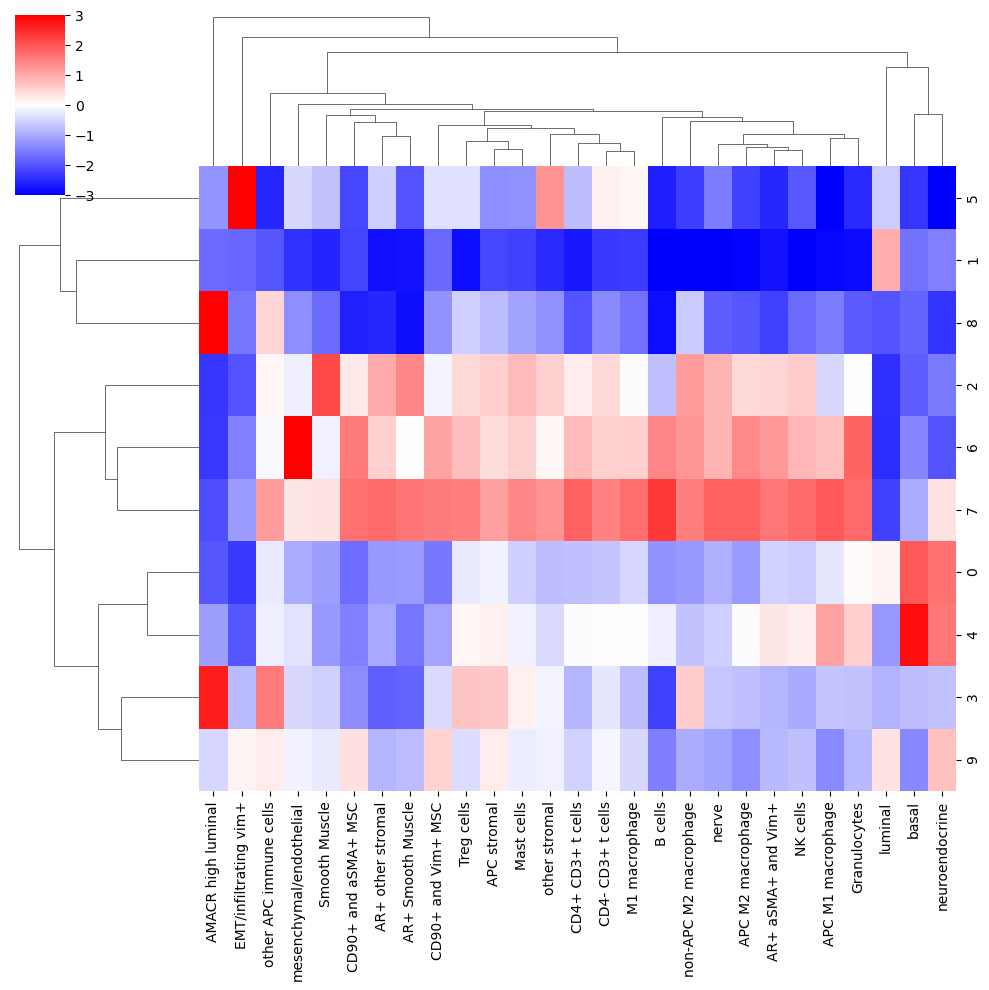

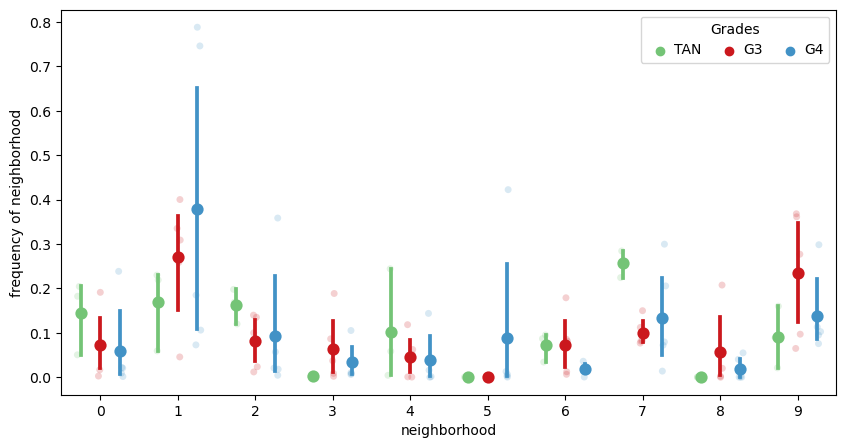

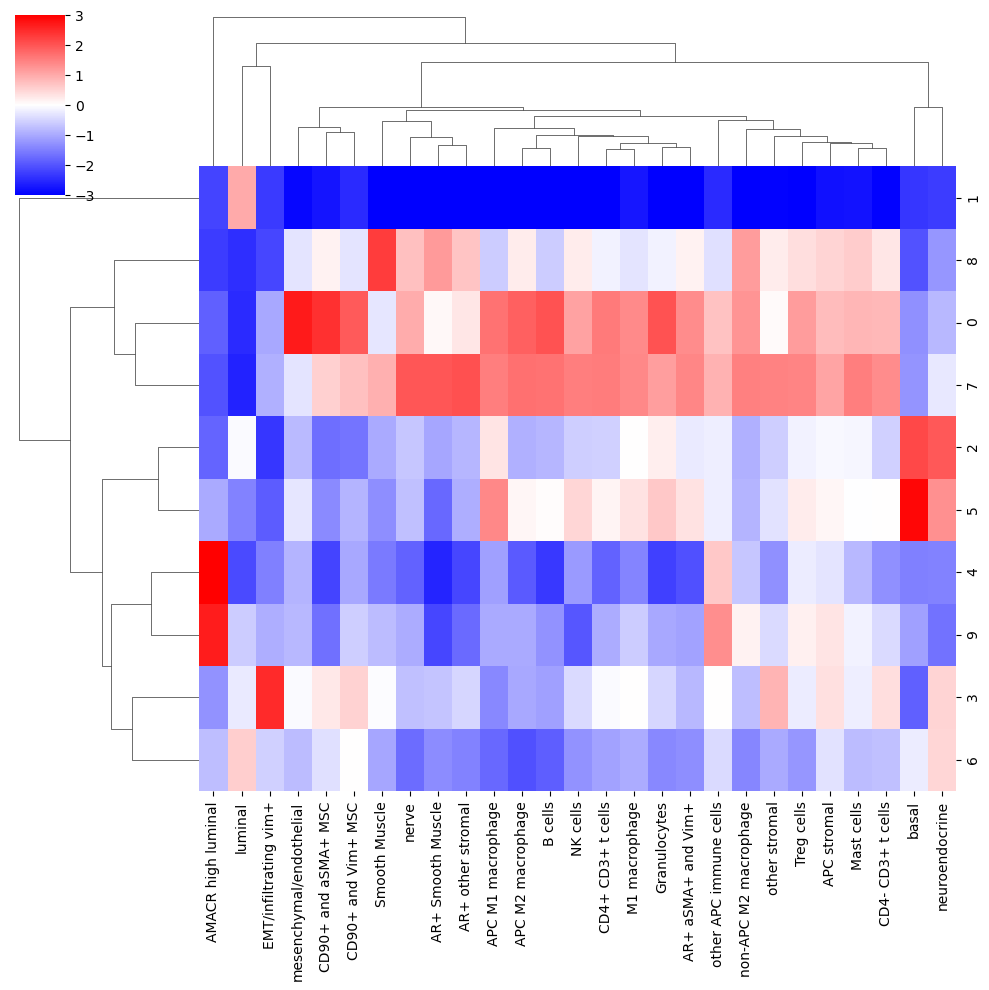

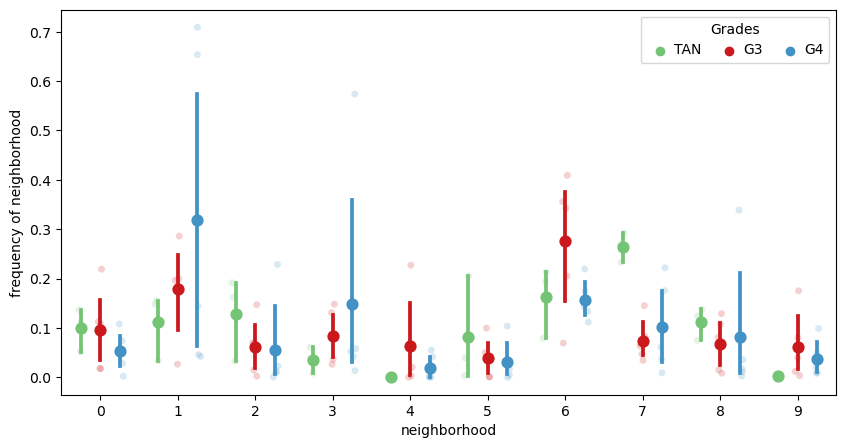

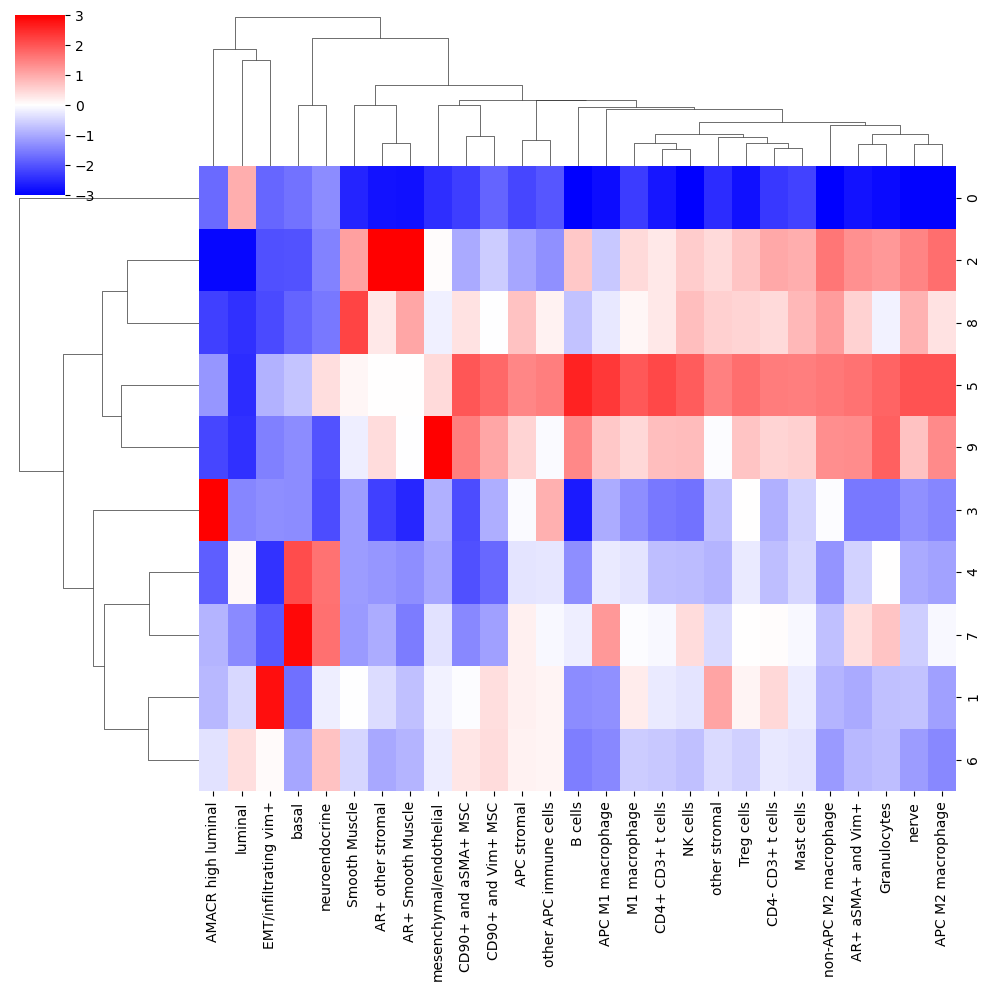

...

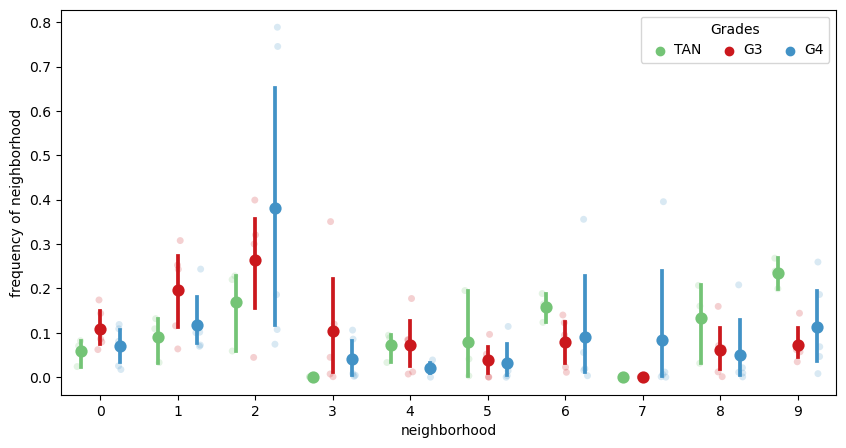

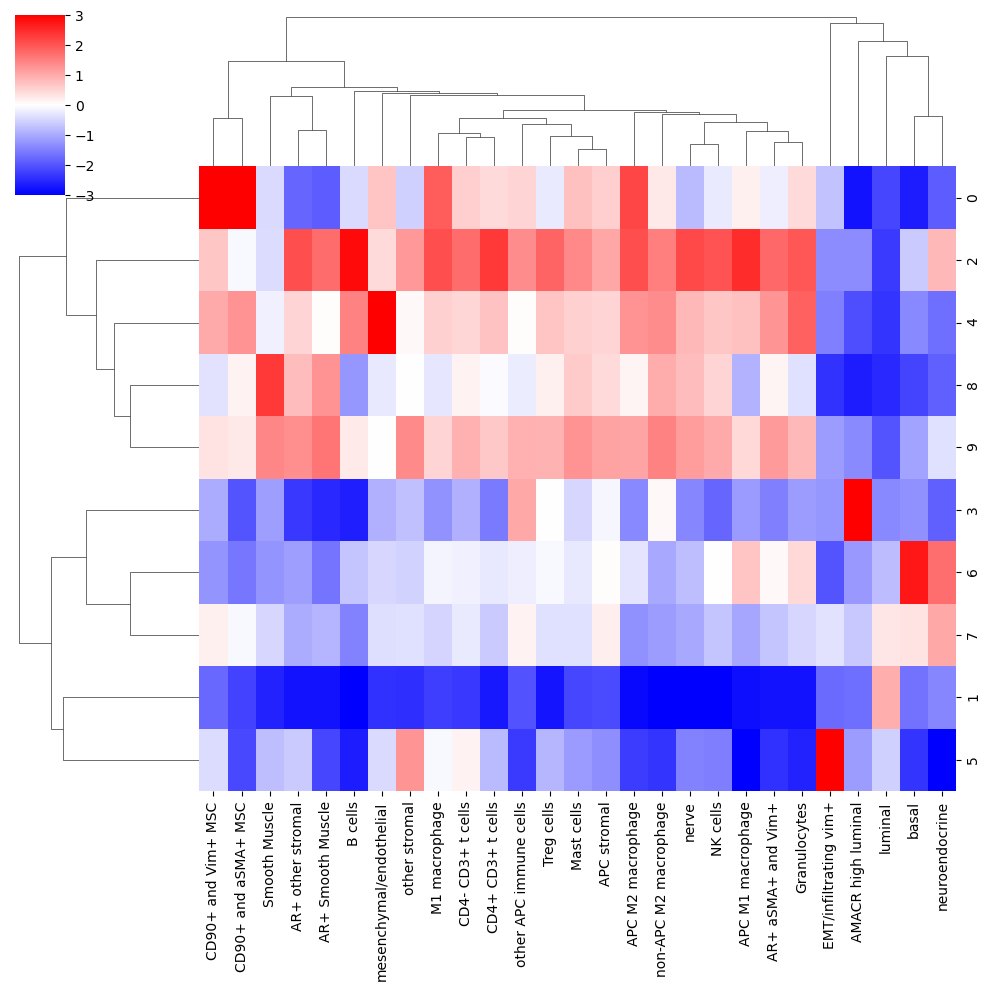

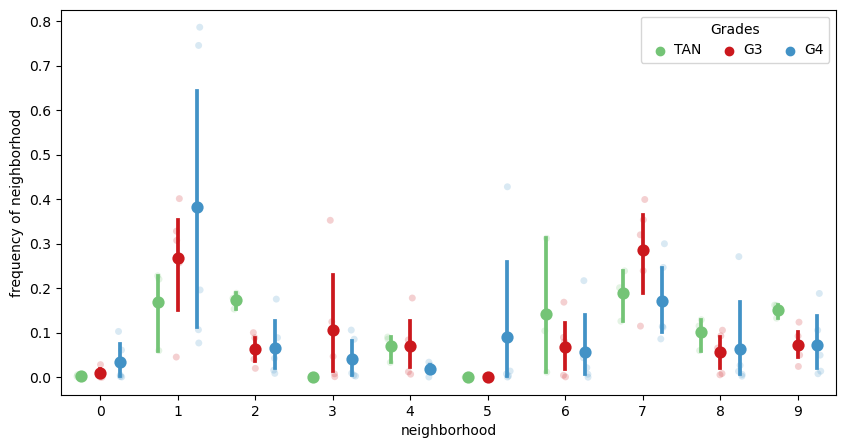

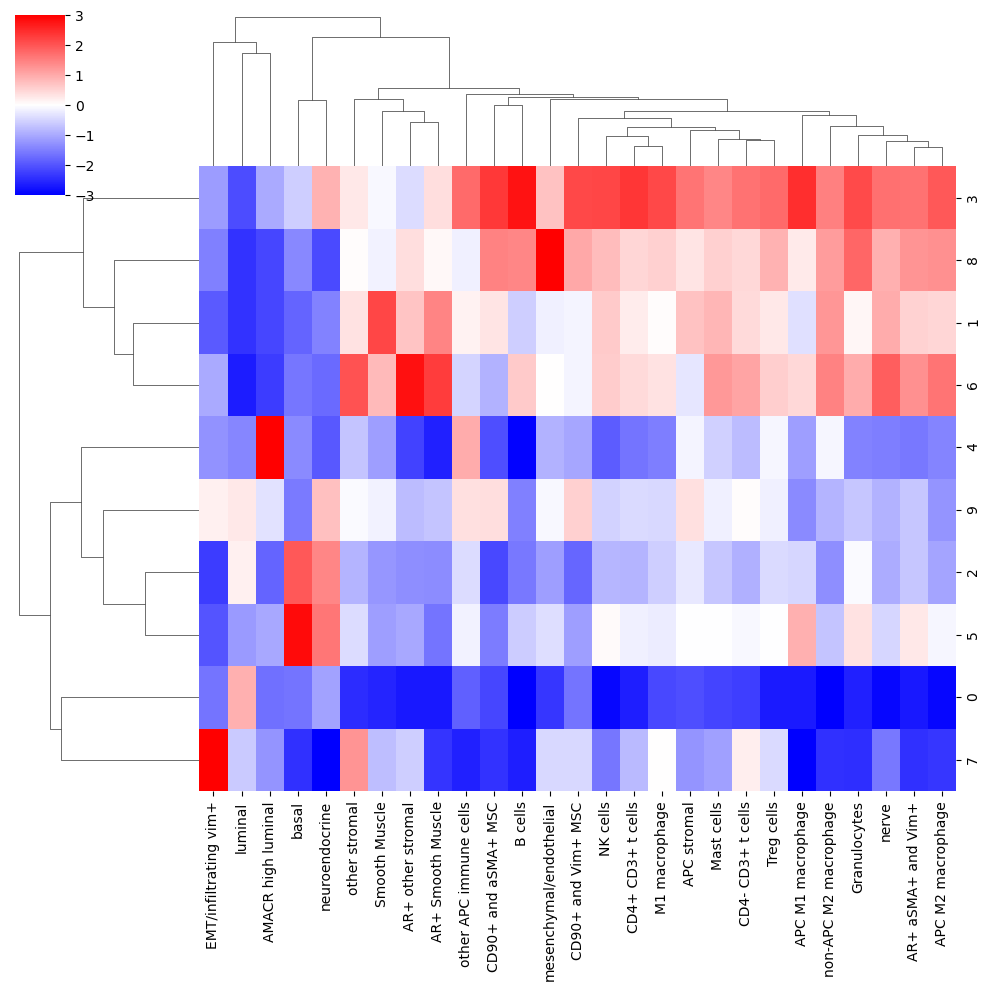

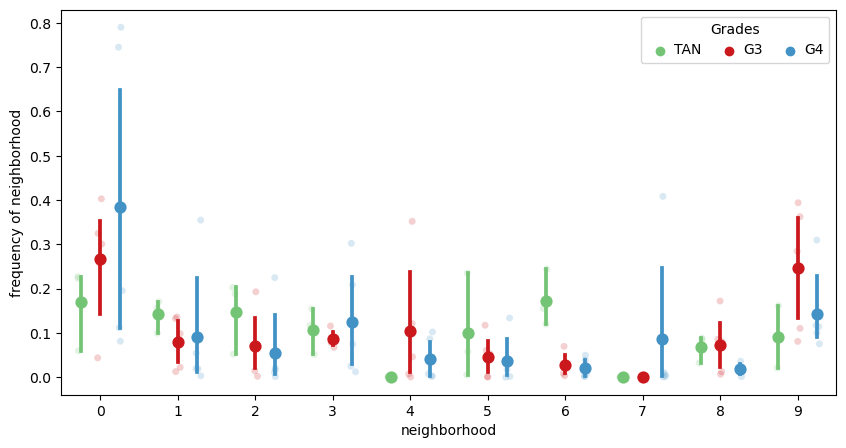

In [4]:
import random

for replication in range(100):
    
    random.seed(replication)
    ############
    #read in data and do some quick data rearrangement
    if file_type == 'pickle':
        cells = pd.read_pickle(path_to_data)
    if file_type == 'csv':
    #CA read data to be combined
        cells1 = pd.read_csv('G3-PCa_dfmerged_Nolan-names_0904.csv')
        cells1_75 = cells1.sample(frac=0.75)
        cells2 = pd.read_csv('G4-PCa_dfmerged_Nolan-names_0904.csv')
        cells2_75 = cells2.sample(frac=0.75)
        cells3 = pd.read_csv('TAN-PCa_dfmerged_Nolan-names_0904.csv')
        cells3_75 = cells3.sample(frac=0.75)
    
    #CA combine all data read with the next to line
    cells_3groups = [cells1_75, cells2_75, cells3_75]
    cells_all = pd.concat(cells_3groups)

    cells = pd.concat([cells_all,pd.get_dummies(cells_all[cluster_col])],1)

    cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

    sum_cols = cells[cluster_col].unique()
    values = cells[sum_cols].values
    #############
    #find windows for each cell in each tissue region
    tissue_group = cells[[X,Y,reg]].groupby(reg)
    exps = list(cells[reg].unique())
    tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
    tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]
    #for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.
    out_dict = {}
    for k in ks:
        for neighbors,job in zip(tissues,tissue_chunks):

            chunk = np.arange(len(neighbors))#indices
            tissue_name = job[2]
            indices = job[3]
            window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
            out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)

    #concatenate the summed windows and combine into one dataframe for each window size tested.
    windows = {}
    for k in ks:
   
        window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
        window = window.loc[cells.index.values]
        window = pd.concat([cells[keep_cols],window],1)
        windows[k] = window
    k = 10
    n_neighborhoods = 10
    neighborhood_name = "neighborhood"+str(k)
    k_centroids = {}
    windows2 = windows[10]
    # windows2[cluster_col] = cells[cluster_col]

    km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

    labelskm = km.fit_predict(windows2[sum_cols].values)
    k_centroids[k] = km.cluster_centers_
    cells['neighborhood10'] = labelskm
    cells[neighborhood_name] = cells[neighborhood_name].astype('category')
    #['reg064_A','reg066_A','reg018_B','reg023_A']
    # this plot shows the types of cells (ClusterIDs) in the different niches 
    k_to_plot = 10
    niche_clusters = (k_centroids[k_to_plot])
    tissue_avgs = values.mean(axis = 0)
    fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
    fc = pd.DataFrame(fc,columns = sum_cols)
    #s=sns.clustermap(fc.loc[[0,2,3,4,5,6,7,8,9],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)
    s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9],], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = True)
    s.savefig("random75_ar_cn/celltypes_perniche_10_replication{}.pdf".format(replication))
    ar_cn=np.unique(np.concatenate((np.where(fc['AR+ aSMA+ and Vim+'] > 0),
               np.where(fc['AR+ Smooth Muscle'] > 0), 
               np.where(fc['AR+ other stromal'] > 0)), axis = None))
    #plot for each group and each patient the percent of total cells allocated to each neighborhood
    fc = cells.groupby(['patients','groups']).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

    fc.columns = range(10)
    melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
    melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
    f,ax = plt.subplots(figsize = (10,5))
    sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])
    sns.pointplot(data = melt, hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood', palette=["#74c476", "#cb181d", "#4292c6"])

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[:3], ['TAN', 'G3', 'G4'], title="Grades", #CA changed labels[:3] to ['TAN', 'G3', 'G4']
          handletextpad=0, columnspacing=1,
          loc="upper right", ncol=3, frameon=True)
    plt.savefig('random75_ar_cn/neighborhood_comparison_by_grade_replication{}.pdf'.format(replication))
    
    from scipy.stats import ttest_ind
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G3
    ttest_tan_g3 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g3.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==3]['frequency of neighborhood']))
    ttest_tan_g3 = pd.DataFrame(ttest_tan_g3)
    ttest_tan_g3 = ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g3.to_csv('random75_ar_cn/ttest_tan_g3_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group TAN vs G4
    ttest_tan_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_tan_g4.append(ttest_ind(n2[n2['groups']==0]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_tan_g4 = pd.DataFrame(ttest_tan_g4)
    ttest_tan_g3= ttest_tan_g3.loc[ar_cn,:]
    ttest_tan_g4.to_csv('random75_ar_cn/ttest_tan_g4_replication{}.csv'.format(replication), index=False)
    
    #t-test to evaluate if any neighborhood is enriched in one group G3 vs G4
    ttest_g3_g4 =[]
    for cn in range(10):
        n2 = melt[melt['neighborhood']==cn]
        ttest_g3_g4.append(ttest_ind(n2[n2['groups']==3]['frequency of neighborhood'],n2[n2['groups']==4]['frequency of neighborhood']))
    ttest_g3_g4 = pd.DataFrame(ttest_g3_g4)
    ttest_g3_g4 = ttest_g3_g4.loc[ar_cn,:]
    ttest_g3_g4.to_csv('random75_ar_cn/ttest_g3_g4_replication{}.csv'.format(replication), index=False)